# Knowledge Graph Rule Discovery

This notebook discovers logical rules in your knowledge graph through compositional reasoning.

## What We'll Discover:

1. **Horn Clauses**: relation1(X,Y) ∧ relation2(Y,Z) → relation3(X,Z)
2. **Inverse Rules**: relation1(X,Y) → relation2(Y,X)
3. **Complex Patterns**: Multi-hop relationships

## Metrics:
- **Support**: How many instances of this rule exist
- **Confidence**: What fraction of the time does the rule hold
- **Examples**: Concrete instances from the data

## Configuration

In [1]:
# Set your dataset path
FILEPATH = "train.txt"  # ← CHANGE THIS

# Minimum support threshold (minimum instances to consider a rule)
MIN_SUPPORT = 3

# Minimum confidence threshold (minimum fraction to consider a rule valid)
MIN_CONFIDENCE = 0.7

## Import Libraries

In [2]:
from collections import defaultdict, Counter
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations, product

sns.set_style("whitegrid")
print("✓ Libraries imported")

✓ Libraries imported


## Load Knowledge Graph

In [22]:
def load_knowledge_graph(filepath):
    """Load knowledge graph as list of triples"""
    triples = []
    
    with open(filepath, 'r', encoding='utf-8') as f:
        for line in f:
            line = line.strip()
            if line and not line.startswith('#'):
                parts = line.split()
                if len(parts) >= 3:
                    subject = parts[0]
                    relation = parts[1]
                    obj = parts[2]
                    triples.append((subject, relation, obj))
    
    return triples

triples = load_knowledge_graph(FILEPATH)
print(f"✓ Loaded {len(triples):,} triples")
print(triples)
# Get all unique relations
relations = set(r for s, r, o in triples)
print(f"✓ Found {len(relations)} unique relation types: {', '.join(sorted(relations))}")

✓ Loaded 13,821 triples
[('olivia0', 'sisterOf', 'selina10'), ('olivia0', 'sisterOf', 'isabella11'), ('olivia0', 'sisterOf', 'oskar24'), ('olivia0', 'sisterOf', 'adam9'), ('olivia0', 'secondAuntOf', 'lena18'), ('olivia0', 'secondAuntOf', 'fabian26'), ('olivia0', 'girlCousinOf', 'leon16'), ('olivia0', 'girlCousinOf', 'johanna22'), ('olivia0', 'girlCousinOf', 'jonas23'), ('olivia0', 'daughterOf', 'katharina1'), ('olivia0', 'daughterOf', 'dominik2'), ('olivia0', 'granddaughterOf', 'ella19'), ('olivia0', 'granddaughterOf', 'david20'), ('olivia0', 'granddaughterOf', 'emma7'), ('olivia0', 'granddaughterOf', 'moritz8'), ('olivia0', 'nieceOf', 'paula12'), ('olivia0', 'nieceOf', 'natalie13'), ('olivia0', 'nieceOf', 'luis14'), ('olivia0', 'motherOf', 'lisa5'), ('olivia0', 'motherOf', 'elias6'), ('katharina1', 'sisterOf', 'paula12'), ('katharina1', 'sisterOf', 'natalie13'), ('katharina1', 'sisterOf', 'luis14'), ('katharina1', 'greatAuntOf', 'lena18'), ('katharina1', 'greatAuntOf', 'fabian26'), ('

## Build Graph Indices

Create efficient data structures for rule mining.

In [4]:
# Build indices for efficient querying
# Index: (subject, relation) -> [objects]
sr_to_o = defaultdict(list)
# Index: (relation, object) -> [subjects]
ro_to_s = defaultdict(list)
# Index: relation -> [(subject, object)]
r_to_pairs = defaultdict(list)

for s, r, o in triples:
    sr_to_o[(s, r)].append(o)
    ro_to_s[(r, o)].append(s)
    r_to_pairs[r].append((s, o))

print("✓ Built graph indices")

✓ Built graph indices


# Rule Type 1: Inverse Rules

Discover rules of the form: **relation1(X,Y) → relation2(Y,X)**

Examples:
- fatherOf(X,Y) → childOf(Y,X)
- spouseOf(X,Y) → spouseOf(Y,X)

In [21]:
def discover_inverse_rules(triples, min_support=3, min_confidence=0.7):
    """
    Discover inverse rules: relation1(X,Y) -> relation2(Y,X)
    
    For each edge relation1(A,B), check if there exists relation2(B,A)
    """
    # Build index: (relation, subject, object) for fast lookup
    edge_set = set()
    relation_pairs = defaultdict(list)
    
    for s, r, o in triples:
        edge_set.add((r, s, o))
        relation_pairs[r].append((s, o))
    
    inverse_rules = []
    all_relations = list(relation_pairs.keys())
    
    # For each pair of relations (r1, r2)
    for r1 in all_relations:
        for r2 in all_relations:
            if r1 == r2:  # Skip same relation (handled by symmetric rules)
                continue
            
            # For each edge r1(A, B), check if r2(B, A) exists
            matches = []
            #print(r1,r2,"\n")
            r1_edges = relation_pairs[r1]
            print(relation_pairs[r1])
            
            for a, b in r1_edges:
                # Check if r2(b, a) exists in the graph
                if (r2, b, a) in edge_set:
                    matches.append((a, b))
            
            support = len(matches)
            
            if support >= min_support:
                total_r1_edges = len(r1_edges)
                confidence = support / total_r1_edges if total_r1_edges > 0 else 0
                
                if confidence >= min_confidence:
                    examples = matches[:5]
                    inverse_rules.append({
                        'rule_type': 'inverse',
                        'rule': f"{r1}(X,Y) → {r2}(Y,X)",
                        'relation1': r1,
                        'relation2': r2,
                        'support': support,
                        'confidence': confidence,
                        'total_edges': total_r1_edges,
                        'examples': examples
                    })
    
    return inverse_rules

# Use it
inverse_rules = discover_inverse_rules(triples, MIN_SUPPORT, MIN_CONFIDENCE)
print(f"✓ Discovered {len(inverse_rules)} inverse rules\n")

for i, rule in enumerate(inverse_rules, 1):
    print(f"Rule {i}: {rule['rule']}")
    print(f"  Support: {rule['support']} instances")
    print(f"  Confidence: {rule['confidence']:.2%} ({rule['support']}/{rule['total_edges']} edges)")
    print(f"  Examples:")
    for a, b in rule['examples'][:3]:
        print(f"    {rule['relation1']}({a}, {b}) → {rule['relation2']}({b}, {a})")
    print()

[('olivia0', 'selina10'), ('olivia0', 'isabella11'), ('olivia0', 'oskar24'), ('olivia0', 'adam9'), ('katharina1', 'paula12'), ('katharina1', 'natalie13'), ('katharina1', 'luis14'), ('selina10', 'olivia0'), ('selina10', 'isabella11'), ('selina10', 'oskar24'), ('selina10', 'adam9'), ('isabella11', 'olivia0'), ('isabella11', 'selina10'), ('isabella11', 'oskar24'), ('isabella11', 'adam9'), ('paula12', 'katharina1'), ('paula12', 'natalie13'), ('paula12', 'luis14'), ('natalie13', 'katharina1'), ('natalie13', 'paula12'), ('natalie13', 'luis14'), ('johanna22', 'jonas23'), ('lisa5', 'nico4'), ('lisa5', 'elias6'), ('hannah39', 'dominik44'), ('marlene40', 'marie43'), ('marlene40', 'sebastian49'), ('marlene40', 'moritz31'), ('marie43', 'marlene40'), ('marie43', 'sebastian49'), ('marie43', 'moritz31'), ('paula50', 'luca33'), ('nora66', 'simon54'), ('nora66', 'philipp70'), ('claudia69', 'tobias57'), ('claudia69', 'magdalena59'), ('elena55', 'rene58'), ('magdalena59', 'claudia69'), ('magdalena59', 't

# Rule Type 2: Composition Rules (2-hop)

Discover rules of the form: **relation1(X,Y) ∧ relation2(Y,Z) → relation3(X,Z)**

Examples:
- motherOf(X,Y) ∧ fatherOf(Y,Z) → grandmotherOf(X,Z)
- fatherOf(X,Y) ∧ motherOf(X,Z) → siblingOf(Y,Z)

In [6]:
def discover_composition_rules(triples, min_support=3, min_confidence=0.7):
    """
    Discover 2-hop composition rules: r1(X,Y) ∧ r2(Y,Z) -> r3(X,Z)
    """
    # Build index: relation -> {(subject, object)}
    rel_index = defaultdict(set)
    for s, r, o in triples:
        rel_index[r].add((s, o))
    
    composition_rules = []
    all_relations = list(rel_index.keys())
    
    # For each pair of relations (r1, r2)
    for r1, r2 in product(all_relations, repeat=2):
        # Find all 2-hop paths: X --r1--> Y --r2--> Z
        two_hop_paths = []
        
        for s1, o1 in rel_index[r1]:
            # o1 is the intermediate node Y
            for s2, o2 in rel_index[r2]:
                if o1 == s2:  # Y matches
                    # Found path: s1 --r1--> o1 --r2--> o2
                    # This gives us s1 --?--> o2
                    two_hop_paths.append((s1, o1, o2))
        
        if len(two_hop_paths) < min_support:
            continue
        
        # For each candidate result relation r3
        for r3 in all_relations:
            if r3 == r1 or r3 == r2:  # Avoid trivial rules
                continue
            
            r3_pairs = rel_index[r3]
            
            # Count how many 2-hop paths have corresponding r3 edge
            matches = []
            for x, y, z in two_hop_paths:
                if (x, z) in r3_pairs:
                    matches.append((x, y, z))
            
            support = len(matches)
            
            if support >= min_support:
                confidence = support / len(two_hop_paths) if two_hop_paths else 0
                
                if confidence >= min_confidence:
                    examples = matches[:5]
                    composition_rules.append({
                        'rule_type': 'composition',
                        'rule': f"{r1}(X,Y) ∧ {r2}(Y,Z) → {r3}(X,Z)",
                        'relation1': r1,
                        'relation2': r2,
                        'relation3': r3,
                        'support': support,
                        'confidence': confidence,
                        'total_paths': len(two_hop_paths),
                        'examples': examples
                    })
    
    return composition_rules

print("Discovering composition rules... (this may take a minute)")
composition_rules = discover_composition_rules(triples, MIN_SUPPORT, MIN_CONFIDENCE)
print(f"\n✓ Discovered {len(composition_rules)} composition rules\n")

for i, rule in enumerate(composition_rules, 1):
    print(f"Rule {i}: {rule['rule']}")
    print(f"  Support: {rule['support']} instances")
    print(f"  Confidence: {rule['confidence']:.2%} ({rule['support']}/{rule['total_paths']} paths)")
    print(f"  Examples:")
    for x, y, z in rule['examples'][:3]:
        print(f"    {rule['relation1']}({x}, {y}) ∧ {rule['relation2']}({y}, {z}) → {rule['relation3']}({x}, {z})")
    print()

Discovering composition rules... (this may take a minute)

✓ Discovered 191 composition rules

Rule 1: sisterOf(X,Y) ∧ motherOf(Y,Z) → auntOf(X,Z)
  Support: 232 instances
  Confidence: 100.00% (232/232 paths)
  Examples:
    sisterOf(sarah1305, beate1302) ∧ motherOf(beate1302, marko1315) → auntOf(sarah1305, marko1315)
    sisterOf(katharina617, lea618) ∧ motherOf(lea618, adam627) → auntOf(katharina617, adam627)
    sisterOf(sofia901, lena906) ∧ motherOf(lena906, marko912) → auntOf(sofia901, marko912)

Rule 2: sisterOf(X,Y) ∧ grandmotherOf(Y,Z) → greatAuntOf(X,Z)
  Support: 112 instances
  Confidence: 100.00% (112/112 paths)
  Examples:
    sisterOf(vanessa276, isabella267) ∧ grandmotherOf(isabella267, sofia285) → greatAuntOf(vanessa276, sofia285)
    sisterOf(lara522, sofia502) ∧ grandmotherOf(sofia502, beate499) → greatAuntOf(lara522, beate499)
    sisterOf(lara522, sofia502) ∧ grandmotherOf(sofia502, julian508) → greatAuntOf(lara522, julian508)

Rule 3: sisterOf(X,Y) ∧ sonOf(Y,Z) → 

# Rule Type 3: Sibling Rules

Discover rules for sibling relationships:
**relation(X,Y) ∧ relation(X,Z) ∧ Y≠Z → siblingRelation(Y,Z)**

Example: fatherOf(X,Y) ∧ fatherOf(X,Z) ∧ Y≠Z → sibling(Y,Z)

In [7]:
def discover_sibling_rules(triples, min_support=3, min_confidence=0.7):
    """
    Discover sibling rules: r(X,Y) ∧ r(X,Z) ∧ Y≠Z -> sibling_r(Y,Z)
    """
    # Build index: (subject, relation) -> [objects]
    sr_index = defaultdict(list)
    rel_index = defaultdict(set)
    
    for s, r, o in triples:
        sr_index[(s, r)].append(o)
        rel_index[r].add((s, o))
    
    sibling_rules = []
    
    # For each relation
    for r1 in rel_index:
        # Find all pairs that share the same subject
        sibling_pairs = []
        
        for (subj, rel), objects in sr_index.items():
            if rel == r1 and len(objects) >= 2:
                # Multiple objects for same subject = potential siblings
                for i, obj1 in enumerate(objects):
                    for obj2 in objects[i+1:]:
                        if obj1 != obj2:
                            sibling_pairs.append((obj1, obj2, subj))
        
        if len(sibling_pairs) < min_support:
            continue
        
        # Check if there's a relation that captures these siblings
        for r2 in rel_index:
            if r2 == r1:
                continue
            
            r2_pairs = rel_index[r2]
            
            # Count matches
            matches = []
            for y, z, x in sibling_pairs:
                if (y, z) in r2_pairs or (z, y) in r2_pairs:
                    matches.append((x, y, z))
            
            support = len(matches)
            
            if support >= min_support:
                confidence = support / len(sibling_pairs) if sibling_pairs else 0
                
                if confidence >= min_confidence:
                    examples = matches[:5]
                    sibling_rules.append({
                        'rule_type': 'sibling',
                        'rule': f"{r1}(X,Y) ∧ {r1}(X,Z) ∧ Y≠Z → {r2}(Y,Z)",
                        'relation1': r1,
                        'relation2': r2,
                        'support': support,
                        'confidence': confidence,
                        'total_pairs': len(sibling_pairs),
                        'examples': examples
                    })
    
    return sibling_rules

sibling_rules = discover_sibling_rules(triples, MIN_SUPPORT, MIN_CONFIDENCE)
print(f"\n✓ Discovered {len(sibling_rules)} sibling rules\n")

for i, rule in enumerate(sibling_rules, 1):
    print(f"Rule {i}: {rule['rule']}")
    print(f"  Support: {rule['support']} instances")
    print(f"  Confidence: {rule['confidence']:.2%} ({rule['support']}/{rule['total_pairs']} pairs)")
    print(f"  Examples:")
    for x, y, z in rule['examples'][:3]:
        print(f"    {rule['relation1']}({x}, {y}) ∧ {rule['relation1']}({x}, {z}) → {rule['relation2']}({y}, {z})")
    print()


✓ Discovered 7 sibling rules

Rule 1: sisterOf(X,Y) ∧ sisterOf(X,Z) ∧ Y≠Z → brotherOf(Y,Z)
  Support: 376 instances
  Confidence: 73.58% (376/511 pairs)
  Examples:
    sisterOf(olivia0, selina10) ∧ sisterOf(olivia0, oskar24) → brotherOf(selina10, oskar24)
    sisterOf(olivia0, selina10) ∧ sisterOf(olivia0, adam9) → brotherOf(selina10, adam9)
    sisterOf(olivia0, isabella11) ∧ sisterOf(olivia0, oskar24) → brotherOf(isabella11, oskar24)

Rule 2: motherOf(X,Y) ∧ motherOf(X,Z) ∧ Y≠Z → sisterOf(Y,Z)
  Support: 327 instances
  Confidence: 74.32% (327/440 pairs)
  Examples:
    motherOf(olivia0, lisa5) ∧ motherOf(olivia0, elias6) → sisterOf(lisa5, elias6)
    motherOf(katharina1, selina10) ∧ motherOf(katharina1, isabella11) → sisterOf(selina10, isabella11)
    motherOf(katharina1, selina10) ∧ motherOf(katharina1, oskar24) → sisterOf(selina10, oskar24)

Rule 3: motherOf(X,Y) ∧ motherOf(X,Z) ∧ Y≠Z → brotherOf(Y,Z)
  Support: 341 instances
  Confidence: 77.50% (341/440 pairs)
  Examples:
    

# Rule Type 4: Symmetric Rules

Discover symmetric relations: **relation(X,Y) ↔ relation(Y,X)**

Example: spouseOf(X,Y) ↔ spouseOf(Y,X)

In [8]:
def discover_symmetric_rules(triples, min_support=3, min_confidence=0.9):
    """
    Discover symmetric relations: r(X,Y) <-> r(Y,X)
    """
    rel_index = defaultdict(set)
    for s, r, o in triples:
        rel_index[r].add((s, o))
    
    symmetric_rules = []
    
    for r in rel_index:
        pairs = rel_index[r]
        
        # Check how many pairs have reverse
        symmetric_pairs = []
        for s, o in pairs:
            if (o, s) in pairs:
                symmetric_pairs.append((s, o))
        
        support = len(symmetric_pairs) // 2  # Divide by 2 to avoid double counting
        
        if support >= min_support:
            confidence = (len(symmetric_pairs) / len(pairs)) if pairs else 0
            
            if confidence >= min_confidence:
                examples = list(symmetric_pairs)[:10:2]  # Take every other to avoid duplicates
                symmetric_rules.append({
                    'rule_type': 'symmetric',
                    'rule': f"{r}(X,Y) ↔ {r}(Y,X)",
                    'relation': r,
                    'support': support,
                    'confidence': confidence,
                    'examples': examples
                })
    
    return symmetric_rules

symmetric_rules = discover_symmetric_rules(triples, MIN_SUPPORT, 0.9)
print(f"\n✓ Discovered {len(symmetric_rules)} symmetric rules\n")

for i, rule in enumerate(symmetric_rules, 1):
    print(f"Rule {i}: {rule['rule']}")
    print(f"  Support: {rule['support']} instances")
    print(f"  Confidence: {rule['confidence']:.2%}")
    print(f"  Examples:")
    for x, y in rule['examples'][:3]:
        print(f"    {rule['relation']}({x}, {y}) ↔ {rule['relation']}({y}, {x})")
    print()


✓ Discovered 0 symmetric rules



# Rule Type 5: Transitivity Rules

Discover transitive relations: **relation(X,Y) ∧ relation(Y,Z) → relation(X,Z)**

Example: ancestorOf(X,Y) ∧ ancestorOf(Y,Z) → ancestorOf(X,Z)

In [9]:
def discover_transitive_rules(triples, min_support=3, min_confidence=0.7):
    """
    Discover transitive rules: r(X,Y) ∧ r(Y,Z) -> r(X,Z)
    """
    rel_index = defaultdict(set)
    for s, r, o in triples:
        rel_index[r].add((s, o))
    
    transitive_rules = []
    
    for r in rel_index:
        pairs = rel_index[r]
        
        # Find all 2-hop paths with same relation
        two_hop_paths = []
        for s1, o1 in pairs:
            for s2, o2 in pairs:
                if o1 == s2 and s1 != o2:  # Avoid loops
                    two_hop_paths.append((s1, o1, o2))
        
        if len(two_hop_paths) < min_support:
            continue
        
        # Check how many have direct edge
        matches = []
        for x, y, z in two_hop_paths:
            if (x, z) in pairs:
                matches.append((x, y, z))
        
        support = len(matches)
        
        if support >= min_support:
            confidence = support / len(two_hop_paths) if two_hop_paths else 0
            
            if confidence >= min_confidence:
                examples = matches[:5]
                transitive_rules.append({
                    'rule_type': 'transitive',
                    'rule': f"{r}(X,Y) ∧ {r}(Y,Z) → {r}(X,Z)",
                    'relation': r,
                    'support': support,
                    'confidence': confidence,
                    'total_paths': len(two_hop_paths),
                    'examples': examples
                })
    
    return transitive_rules

transitive_rules = discover_transitive_rules(triples, MIN_SUPPORT, MIN_CONFIDENCE)
print(f"\n✓ Discovered {len(transitive_rules)} transitive rules\n")

for i, rule in enumerate(transitive_rules, 1):
    print(f"Rule {i}: {rule['rule']}")
    print(f"  Support: {rule['support']} instances")
    print(f"  Confidence: {rule['confidence']:.2%} ({rule['support']}/{rule['total_paths']} paths)")
    print(f"  Examples:")
    for x, y, z in rule['examples'][:3]:
        print(f"    {rule['relation']}({x}, {y}) ∧ {rule['relation']}({y}, {z}) → {rule['relation']}({x}, {z})")
    print()


✓ Discovered 2 transitive rules

Rule 1: sisterOf(X,Y) ∧ sisterOf(Y,Z) → sisterOf(X,Z)
  Support: 540 instances
  Confidence: 100.00% (540/540 paths)
  Examples:
    sisterOf(katharina617, lea618) ∧ sisterOf(lea618, karin613) → sisterOf(katharina617, karin613)
    sisterOf(katharina617, lea618) ∧ sisterOf(lea618, paula614) → sisterOf(katharina617, paula614)
    sisterOf(valerie690, lara682) ∧ sisterOf(lara682, dominik702) → sisterOf(valerie690, dominik702)

Rule 2: brotherOf(X,Y) ∧ brotherOf(Y,Z) → brotherOf(X,Z)
  Support: 380 instances
  Confidence: 100.00% (380/380 paths)
  Examples:
    brotherOf(samuel1216, dominik1227) ∧ brotherOf(dominik1227, magdalena1236) → brotherOf(samuel1216, magdalena1236)
    brotherOf(samuel1216, dominik1227) ∧ brotherOf(dominik1227, stefan1219) → brotherOf(samuel1216, stefan1219)
    brotherOf(samuel1216, dominik1227) ∧ brotherOf(dominik1227, angelina1220) → brotherOf(samuel1216, angelina1220)



# Combine All Discovered Rules

In [12]:
# Combine all rules
all_rules = (
    inverse_rules + 
    composition_rules + 
    sibling_rules + 
    symmetric_rules + 
    transitive_rules
)

print(f"\n{'='*80}")
print(f"TOTAL RULES DISCOVERED: {len(all_rules)}")
print(f"{'='*80}\n")

print(f"Breakdown by type:")
print(f"  Inverse rules:      {len(inverse_rules)}")
print(f"  Composition rules:  {len(composition_rules)}")
print(f"  Sibling rules:      {len(sibling_rules)}")
print(f"  Symmetric rules:    {len(symmetric_rules)}")
print(f"  Transitive rules:   {len(transitive_rules)}")


TOTAL RULES DISCOVERED: 200

Breakdown by type:
  Inverse rules:      0
  Composition rules:  191
  Sibling rules:      7
  Symmetric rules:    0
  Transitive rules:   2


# Create Summary DataFrame

In [13]:
# Create DataFrame for analysis
summary_data = []
for rule in all_rules:
    summary_data.append({
        'Rule Type': rule['rule_type'],
        'Rule': rule['rule'],
        'Support': rule['support'],
        'Confidence': rule['confidence']
    })

df_rules = pd.DataFrame(summary_data)
df_rules = df_rules.sort_values('Confidence', ascending=False)

print("\nTop 10 Rules by Confidence:")
display(df_rules.head(10))

# Save to CSV
df_rules.to_csv('discovered_rules.csv', index=False)
print("\n✓ Saved rules to: discovered_rules.csv")


Top 10 Rules by Confidence:


,Rule Type,Rule,Support,Confidence
0,composition,"sisterOf(X,Y) ∧ motherOf(Y,Z) → auntOf(X,Z)",232,1.0
109,composition,"sonOf(X,Y) ∧ daughterOf(Y,Z) → grandsonOf(X,Z)",194,1.0
111,composition,"sonOf(X,Y) ∧ greatAuntOf(Y,Z) → secondUncleOf(...",53,1.0
112,composition,"sonOf(X,Y) ∧ auntOf(Y,Z) → boyCousinOf(X,Z)",131,1.0
113,composition,"sonOf(X,Y) ∧ uncleOf(Y,Z) → boyCousinOf(X,Z)",116,1.0
114,composition,"sonOf(X,Y) ∧ greatUncleOf(Y,Z) → secondUncleOf...",40,1.0
115,composition,"sonOf(X,Y) ∧ brotherOf(Y,Z) → nephewOf(X,Z)",200,1.0
116,composition,"sonOf(X,Y) ∧ sonOf(Y,Z) → grandsonOf(X,Z)",265,1.0
117,composition,"sonOf(X,Y) ∧ secondUncleOf(Y,Z) → boySecondCou...",31,1.0
118,composition,"sonOf(X,Y) ∧ boyCousinOf(Y,Z) → boyFirstCousin...",55,1.0



✓ Saved rules to: discovered_rules.csv


# Visualizations

## Plot 1: Rules by Type

✓ Saved: rules_by_type.png


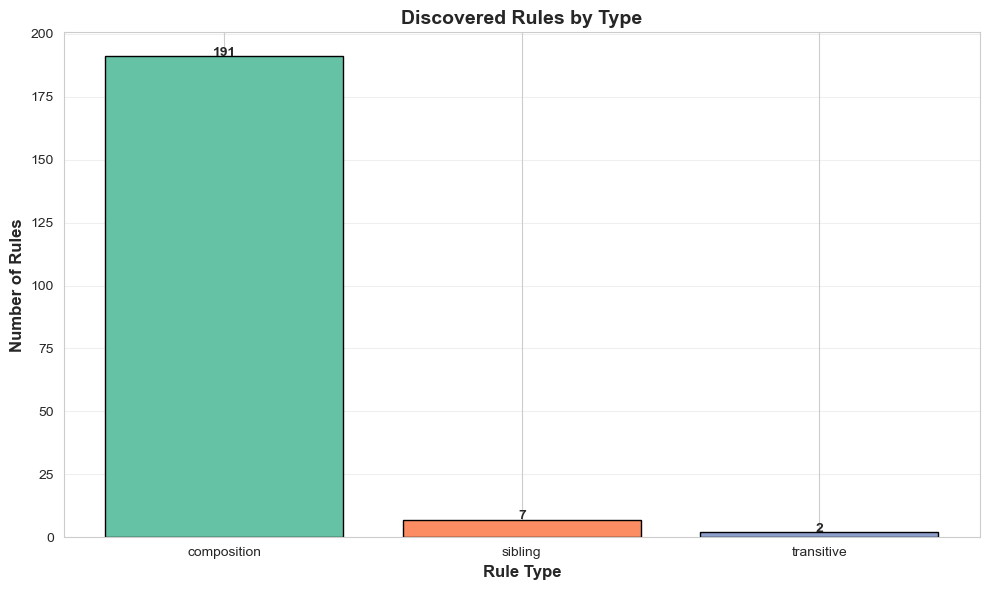

In [14]:
fig, ax = plt.subplots(figsize=(10, 6))

rule_counts = df_rules['Rule Type'].value_counts()
colors = sns.color_palette('Set2', len(rule_counts))

ax.bar(rule_counts.index, rule_counts.values, color=colors, edgecolor='black')
ax.set_xlabel('Rule Type', fontsize=12, fontweight='bold')
ax.set_ylabel('Number of Rules', fontsize=12, fontweight='bold')
ax.set_title('Discovered Rules by Type', fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

for i, (idx, val) in enumerate(rule_counts.items()):
    ax.text(i, val + 0.1, str(val), ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig('rules_by_type.png', dpi=200, bbox_inches='tight')
print("✓ Saved: rules_by_type.png")
plt.show()

## Plot 2: Support vs Confidence

✓ Saved: support_vs_confidence.png


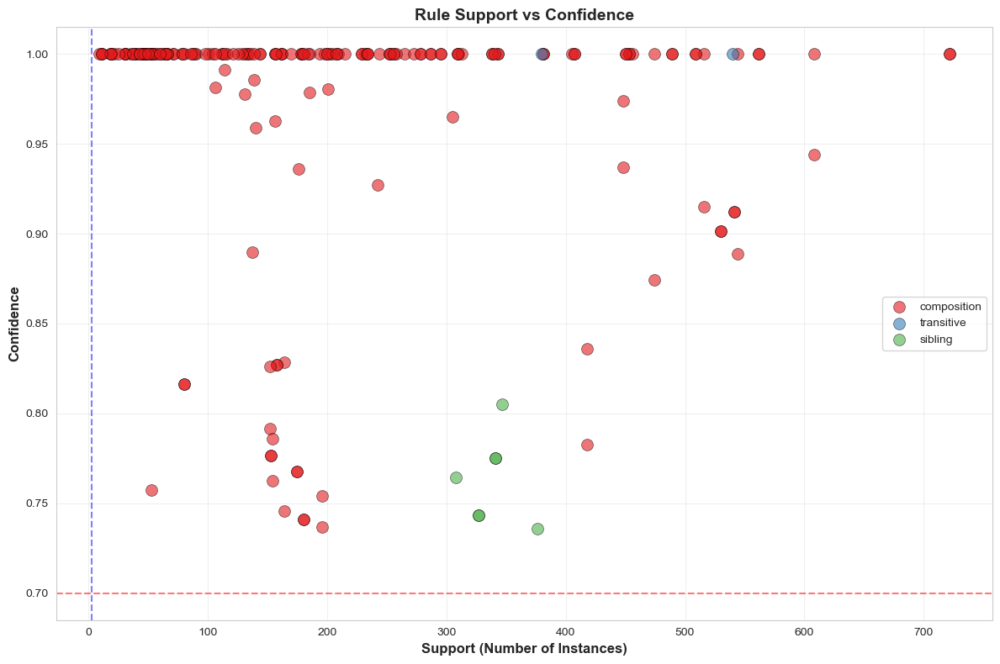

In [15]:
fig, ax = plt.subplots(figsize=(12, 8))

# Color by rule type
rule_types = df_rules['Rule Type'].unique()
colors_map = {rt: color for rt, color in zip(rule_types, sns.color_palette('Set1', len(rule_types)))}

for rule_type in rule_types:
    mask = df_rules['Rule Type'] == rule_type
    ax.scatter(df_rules[mask]['Support'], 
              df_rules[mask]['Confidence'],
              label=rule_type,
              s=100,
              alpha=0.6,
              color=colors_map[rule_type],
              edgecolor='black',
              linewidth=0.5)

ax.set_xlabel('Support (Number of Instances)', fontsize=12, fontweight='bold')
ax.set_ylabel('Confidence', fontsize=12, fontweight='bold')
ax.set_title('Rule Support vs Confidence', fontsize=14, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(alpha=0.3)

# Add threshold lines
ax.axhline(y=MIN_CONFIDENCE, color='red', linestyle='--', alpha=0.5, label=f'Min Confidence ({MIN_CONFIDENCE})')
ax.axvline(x=MIN_SUPPORT, color='blue', linestyle='--', alpha=0.5, label=f'Min Support ({MIN_SUPPORT})')

plt.tight_layout()
plt.savefig('support_vs_confidence.png', dpi=200, bbox_inches='tight')
print("✓ Saved: support_vs_confidence.png")
plt.show()

## Plot 3: Top Rules Heatmap

✓ Saved: top_rules_heatmap.png


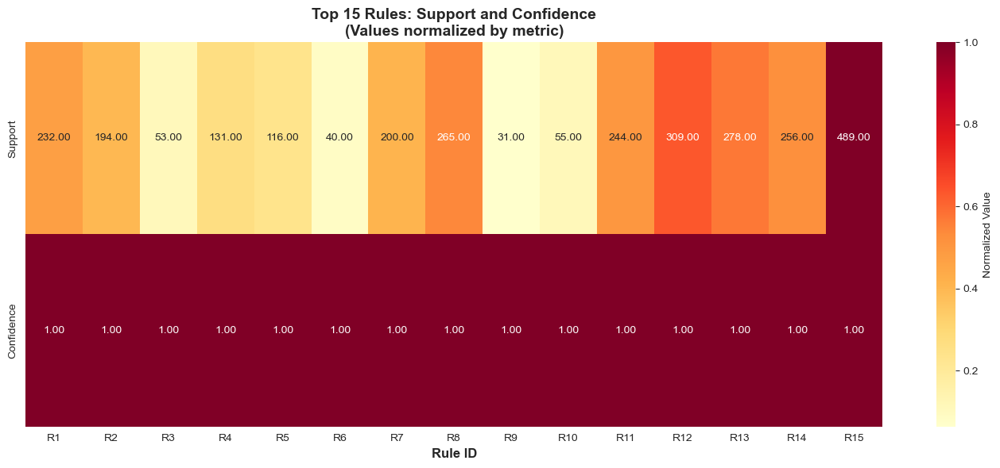


Rule ID Legend:
R1: sisterOf(X,Y) ∧ motherOf(Y,Z) → auntOf(X,Z)
R2: sonOf(X,Y) ∧ daughterOf(Y,Z) → grandsonOf(X,Z)
R3: sonOf(X,Y) ∧ greatAuntOf(Y,Z) → secondUncleOf(X,Z)
R4: sonOf(X,Y) ∧ auntOf(Y,Z) → boyCousinOf(X,Z)
R5: sonOf(X,Y) ∧ uncleOf(Y,Z) → boyCousinOf(X,Z)
R6: sonOf(X,Y) ∧ greatUncleOf(Y,Z) → secondUncleOf(X,Z)
R7: sonOf(X,Y) ∧ brotherOf(Y,Z) → nephewOf(X,Z)
R8: sonOf(X,Y) ∧ sonOf(Y,Z) → grandsonOf(X,Z)
R9: sonOf(X,Y) ∧ secondUncleOf(Y,Z) → boySecondCousinOf(X,Z)
R10: sonOf(X,Y) ∧ boyCousinOf(Y,Z) → boyFirstCousinOnceRemovedOf(X,Z)
R11: sonOf(X,Y) ∧ grandsonOf(Y,Z) → greatGrandsonOf(X,Z)
R12: fatherOf(X,Y) ∧ motherOf(Y,Z) → grandfatherOf(X,Z)
R13: fatherOf(X,Y) ∧ greatAuntOf(Y,Z) → greatGrandfatherOf(X,Z)
R14: fatherOf(X,Y) ∧ grandmotherOf(Y,Z) → greatGrandfatherOf(X,Z)
R15: fatherOf(X,Y) ∧ auntOf(Y,Z) → grandfatherOf(X,Z)


In [16]:
# Top 15 rules
top_rules = df_rules.head(15).copy()
top_rules['Rule_Short'] = top_rules['Rule'].str[:40] + '...'  # Truncate for display

# Create matrix for heatmap
heatmap_data = top_rules[['Support', 'Confidence']].T

fig, ax = plt.subplots(figsize=(14, 6))

# Normalize each metric independently
heatmap_normalized = heatmap_data.copy()
for idx in heatmap_data.index:
    max_val = heatmap_data.loc[idx].max()
    if max_val > 0:
        heatmap_normalized.loc[idx] = heatmap_data.loc[idx] / max_val

sns.heatmap(heatmap_normalized,
           annot=heatmap_data.values,
           fmt='.2f',
           cmap='YlOrRd',
           xticklabels=[f"R{i+1}" for i in range(len(top_rules))],
           yticklabels=['Support', 'Confidence'],
           cbar_kws={'label': 'Normalized Value'},
           ax=ax)

ax.set_title('Top 15 Rules: Support and Confidence\n(Values normalized by metric)', 
            fontsize=14, fontweight='bold')
ax.set_xlabel('Rule ID', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('top_rules_heatmap.png', dpi=200, bbox_inches='tight')
print("✓ Saved: top_rules_heatmap.png")
plt.show()

print("\nRule ID Legend:")
for i, rule in enumerate(top_rules['Rule'], 1):
    print(f"R{i}: {rule}")

# Summary Report

In [17]:
print("="*80)
print("RULE DISCOVERY SUMMARY REPORT")
print("="*80)

print(f"\nDataset: {FILEPATH}")
print(f"Total triples: {len(triples):,}")
print(f"Unique relations: {len(relations)}")

print(f"\nDiscovery Parameters:")
print(f"  Minimum support: {MIN_SUPPORT}")
print(f"  Minimum confidence: {MIN_CONFIDENCE}")

print(f"\nRules Discovered: {len(all_rules)}")
print(f"  Inverse: {len(inverse_rules)}")
print(f"  Composition: {len(composition_rules)}")
print(f"  Sibling: {len(sibling_rules)}")
print(f"  Symmetric: {len(symmetric_rules)}")
print(f"  Transitive: {len(transitive_rules)}")

print(f"\nTop 5 Rules by Confidence:")
for i, (_, row) in enumerate(df_rules.head(5).iterrows(), 1):
    print(f"\n{i}. {row['Rule']}")
    print(f"   Type: {row['Rule Type']}")
    print(f"   Support: {row['Support']}")
    print(f"   Confidence: {row['Confidence']:.2%}")

print("\n" + "="*80)
print("✓ Rule discovery complete!")
print("="*80)

RULE DISCOVERY SUMMARY REPORT

Dataset: train.txt
Total triples: 13,821
Unique relations: 28

Discovery Parameters:
  Minimum support: 3
  Minimum confidence: 0.7

Rules Discovered: 200
  Inverse: 0
  Composition: 191
  Sibling: 7
  Symmetric: 0
  Transitive: 2

Top 5 Rules by Confidence:

1. sisterOf(X,Y) ∧ motherOf(Y,Z) → auntOf(X,Z)
   Type: composition
   Support: 232
   Confidence: 100.00%

2. sonOf(X,Y) ∧ daughterOf(Y,Z) → grandsonOf(X,Z)
   Type: composition
   Support: 194
   Confidence: 100.00%

3. sonOf(X,Y) ∧ greatAuntOf(Y,Z) → secondUncleOf(X,Z)
   Type: composition
   Support: 53
   Confidence: 100.00%

4. sonOf(X,Y) ∧ auntOf(Y,Z) → boyCousinOf(X,Z)
   Type: composition
   Support: 131
   Confidence: 100.00%

5. sonOf(X,Y) ∧ uncleOf(Y,Z) → boyCousinOf(X,Z)
   Type: composition
   Support: 116
   Confidence: 100.00%

✓ Rule discovery complete!
